## Clustering con uso de librerias. Datos 1

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

from sklearn.metrics import silhouette_score

import folium


## Funciones y métodos

### Función de optimización de agrupamiento usando los métodos del codo y silueta en paralelo

In [28]:
from sklearn.metrics import silhouette_score

def optimalClusters(
        data,
        max_Clusters: int,
        init_mode   = 'k-means++',
        nInit       = 'auto',
        randomState = 45,
        max_iter    = 50,):
    
    distortion_elbow, distortion_silhouette = [], []
    
    for i in range(2, max_Clusters + 1):
        test_model = KMeans(
            n_clusters          = i,
            init                = init_mode,
            n_init              = nInit,
            random_state        = randomState,
            max_iter            = max_iter,
        )
        test_model.fit(data)
    
        #Elbow method
        distortion_elbow.append(test_model.inertia_)
    
        #Silhouette method
        labels1 = test_model.fit_predict(data)
        sil_avg = silhouette_score(data, labels1)
        distortion_silhouette.append(sil_avg)
    
    return distortion_elbow, distortion_silhouette

### Función de comparación visual de los métodos del codo y silueta usando matplotlib

In [34]:
def elbow_and_silhouette_visual_comparison(
        distortion_elbow_list           : list[float], 
        distortion_silhouette_list      : list[float],
        elbow_Color                     = '#385187',
        silhouette_Color                = '#027A7B',
        fig_size                        = (11, 6),):
    
    #--------------- Some variables -------------------
    iterations = np.array(distortion_elbow_list).shape[0] + 2
    
        
    fig, ax1 = plt.subplots(figsize = fig_size)
    ax1.set_title('Elbow Method and Silhouette Method Compasison', size = 20, pad = 10)

    #--------------- WCSS / Distorsion -----------------
    ax1.plot(
        range(2, iterations), 
        distortion_elbow_list, 
        linestyle = '--', 
        linewidth = 1.5, 
        marker = 'P', 
        markersize = 10, 
        color = elbow_Color, 
        label = 'The Elbow Method',)
    
    #----------- optimal number of clusters -----------------
    ax1.set_xlabel( 'Number of clusters', size = 15 )
    ax1.set_ylabel('WCSS', size = 15 )
    ax1.tick_params( axis = 'x', labelsize = 12 )
    ax1.tick_params( axis = 'y', labelsize = 12 )

    plt.legend(loc='upper center', prop = {'size':12})
    
    # ------------- silhoutte coeff -------------
    ax2 = ax1.twinx()
    ax2.plot(
        range(2, iterations), 
        distortion_elbow_list,
        linestyle = ':', linewidth = 1.5,
        marker = 'o', markersize = 10,
        color = silhouette_Color ,
        label = 'The Silhouette Method',)

    ax2.set_ylabel('\nSilhoutte Coefficent', size = 15)
    ax2.tick_params(axis = 'y', labelsize = 12)
    plt.legend(loc=0, prop = {'size':12})

    ax1.grid(linestyle = 'dashed', alpha = 0.5)
    
    plt.show()

### Modelo final de clustering

In [36]:
def labels_KMeans(
    data, 
    n_cluster   : int, 
    init_mode   = 'k-means++', 
    n_init      = 'auto', 
    randomState = 45, 
    max_iter    = 50,):
    
    kmeans_model_Final = KMeans(
            n_clusters          = n_cluster,
            init                = init_mode,
            n_init              = n_init,
            random_state        = randomState,
            max_iter            = max_iter,
        )
    kmeans_model_Final.fit(data)
    labels = kmeans_model_Final.predict(data)
    
    return labels

## Datos

In [2]:
housingDF = pd.read_csv('data/info_Casas_SF.csv')
housingDF.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [3]:
df_map = housingDF[['longitude', 'latitude']]
df_map.head()

,longitude,latitude
0,-122.23,37.88
1,-122.22,37.86
2,-122.24,37.85
3,-122.25,37.85
4,-122.25,37.85


In [4]:
features = ['longitude', 'latitude']

In [5]:
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler

df_map_standardized = preprocessing.scale(df_map[features])
dfStandar = StandardScaler().fit(df_map[features])


## Definir número de agrupamientos óptimos con los métodos del codo y silueta

### Métodos del codo y sliueta en paralelo

In [13]:
elbow_List, silhouette_List = optimalClusters(df_map_standardized, max_Clusters=14)

In [14]:
print(elbow_List)
print(silhouette_List)

[6239.859286064884, 5160.8410619411325, 3387.6418488238824, 2435.291900486919, 2215.129446920636, 1944.142269516067, 1521.0525716629868, 1288.5892527595233, 1157.3046258702807, 1063.8523768267232, 949.0475688467077, 859.3787026982485, 797.8117576982]
[0.754899422483308, 0.6298190216853976, 0.6186459244058767, 0.5814972049088774, 0.4801448822934657, 0.531738561707364, 0.45885563220240194, 0.48196371466301535, 0.45868478842428795, 0.43847134182739483, 0.44655181806100924, 0.45293185414836246, 0.46718543620020475]


### Gráfica comparadora

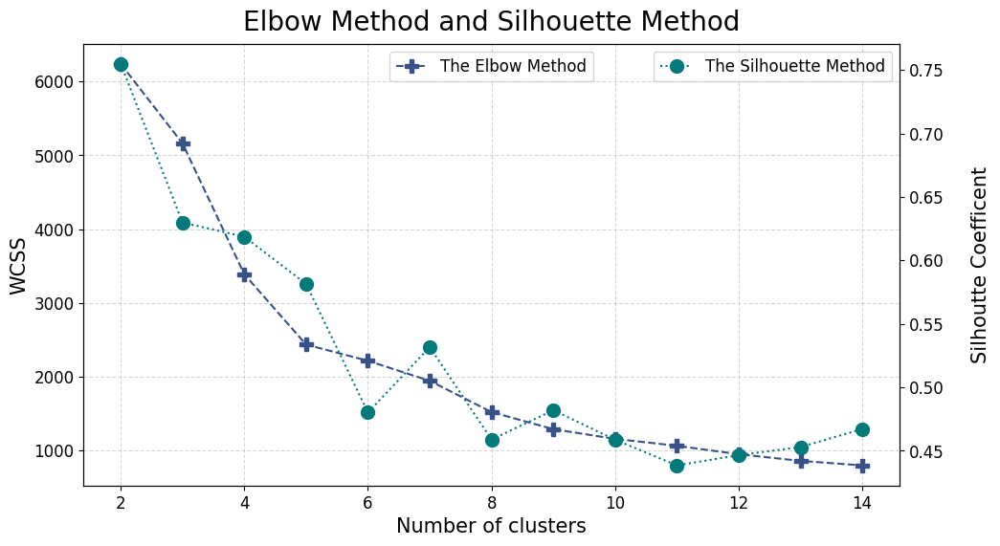

In [15]:
fig , ax1 = plt.subplots( figsize = (11 ,6) )

ax1.set_title('Elbow Method and Silhouette Method', size = 20, pad = 10 )

#--------------- WCSS -----------------
ax1.plot( range(2, 15), elbow_List,
         linestyle = '--', linewidth = 1.5,
         marker = 'P', markersize = 10,
         color = '#385187' ,
         label = 'The Elbow Method'
        )

#----------- optimal number of clusters -----------------
ax1.set_xlabel( 'Number of clusters', size = 15 )
ax1.set_ylabel('WCSS', size = 15 )
ax1.tick_params( axis = 'x', labelsize = 12 )
ax1.tick_params( axis = 'y', labelsize = 12 )

plt.legend(loc='upper center', prop = {'size':12})

# ------------- silhoutte coeff -------------
ax2 = ax1.twinx()
ax2.plot( range(2, 15), silhouette_List,
         linestyle = ':', linewidth = 1.5,
         marker = 'o', markersize = 10,
         color = '#027A7B' ,
         label = 'The Silhouette Method'
        )

ax2.set_ylabel( '\nSilhoutte Coefficent', size = 15 )
ax2.tick_params( axis = 'y', labelsize = 12 )
plt.legend(loc=0, prop = {'size':12})

ax1.grid(  linestyle = 'dashed', alpha = 0.5 )

plt.show()

## Presentación final de datos en el mapa

In [ ]:
clusters = 7
kmeans_model_Final = KMeans(
            n_clusters = clusters, 
            max_iter = 45, 
            n_init = 1,
            random_state = 45
        )
kmeans_model_Final.fit(df_map_standardized)
y_model = kmeans_model_Final.predict(df_map_standardized)
#y_model = kmeans_model_Final.labels_

array([[ 0.67913303, -0.76367666],
       [-1.17877386,  1.02848616],
       [-1.35131322,  2.00168582],
       [-0.1178435 ,  0.61123733],
       [ 1.30603952, -1.27776625],
       [ 1.09649862, -0.76095752],
       [-0.02534335, -0.34178027]])

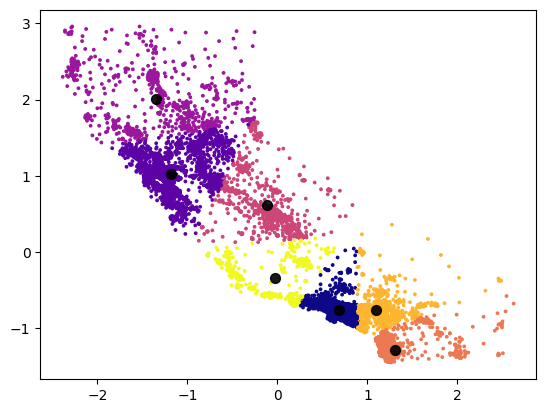

In [ ]:
plt.scatter(df_map_standardized[:, 0], df_map_standardized[:, 1], c=y_model, s=3, cmap='plasma')
centers = kmeans_model_Final.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=50, alpha=0.9)
centers

In [ ]:
centersNew = dfStandar.inverse_transform(centers)
type(centersNew)

numpy.ndarray

### Visualización en mapa con folium

In [ ]:
colorsDic = {
    '0' : '#0295ca',
    '1' : '#75b9d4',
    '2' : '#38b1c2',
    '3' : '#017c6e',
    '4' : '#00a76a',
    '5' : '#52c7b8',
    '6' : '#519876',
}

In [ ]:
aws = []
#aws.append(colorsDic[str(y_model[1236])])

aws = [colorsDic[str(y_model[i])] for i in range(20635)]

In [ ]:
import folium

zoom = 6

map_SF = folium.Map(location=[37.50,-122.2], zoom_start=zoom, min_zoom=zoom, max_zoom=zoom)

In [ ]:
for i in range(len(df_map)):
    folium.Circle(
        radius      = 100,
        location    = [df_map['latitude'][i], df_map['longitude'][i]],
        color       = colorsDic[str(y_model[i])],
        fill=True,
    ).add_to(map_SF)
    
for j in range(centersNew.shape[0]):
    lat, lon = centersNew[j, 1], centersNew[j, 0] 
    folium.Marker(
        location=[lat, lon],
        icon=folium.Icon(color='black',prefix='glyphicon',icon='crosshairs'),
        popup='<h3 style="color:black;">Centroide ' + str(j+1) + '</h3>',
    ).add_to(map_SF)
    
map_SF